In [36]:
from IPython.display import clear_output
from typing import Union, List
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns
from tqdm import tqdm
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torch.optim import Adam
from torch.nn import BCELoss
from torchvision.transforms import Resize

In [37]:
sns.set()

In [70]:
DATA_PATH_PREFIX: str = "./data/"
DATA_CSV_PATH: str = "./data/metadata.csv"

COLUMNS: int = 2
ROWS: int = 1
COLORS: List[str] = ["RED", "GREEN", "BLUE"]

IMG_DIM = 256
RGB_VAL: int = 255

BATCH_SIZE: int = 16
LEARNING_RATE = 1e-4
EPOCHS = 16

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

TEST_TRESHOLD = 25

In [39]:
print(DEVICE)

cuda:0


### Functions

In [40]:
def show_image(image: Union[str, np.array], mask: Union[str, np.array], is_training = False):
    fig = plt.figure(figsize=(10, 10))
    
    if type(image) == str:
        image = Image.open(image)
    else:
        image = image.detach().cpu()
        if is_training:
            image = image.permute(2, 1, 0)

    
    fig.add_subplot(ROWS, COLUMNS, 1)
    plt.imshow(image)
    
    if type(mask) == str:
        mask = Image.open(mask)
    else:
        mask = mask.detach().cpu()

    fig.add_subplot(ROWS, COLUMNS, 2)
    plt.imshow(mask)
    
    plt.show()

### Data preparation

In [41]:
paths_to_images = pd.read_csv(DATA_CSV_PATH)
paths_to_images.drop(axis=1, inplace=True, columns=['image_id'])

In [42]:
paths_to_images.split.unique()

array(['train', 'valid', 'test'], dtype=object)

In [43]:
training_images_paths = paths_to_images[paths_to_images["split"] == "train"]
valid_images_paths = paths_to_images[paths_to_images["split"] == "valid"]
test_images_paths = paths_to_images[paths_to_images["split"] == "test"]

splits = [training_images_paths, valid_images_paths, test_images_paths]
for split in splits:
    split.drop(axis=1, inplace=True, columns="split")
    split["sat_image_path"] = split["sat_image_path"].apply(lambda path: DATA_PATH_PREFIX + path)

training_images_paths["mask_path"] = training_images_paths["mask_path"].apply(lambda path: DATA_PATH_PREFIX + path)

C:\Users\Młody\AppData\Local\Temp\ipykernel_13108\1751739964.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  split.drop(axis=1, inplace=True, columns="split")
C:\Users\Młody\AppData\Local\Temp\ipykernel_13108\1751739964.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  split["sat_image_path"] = split["sat_image_path"].apply(lambda path: DATA_PATH_PREFIX + path)
C:\Users\Młody\AppData\Local\Temp\ipykernel_13108\1751739964.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: ht

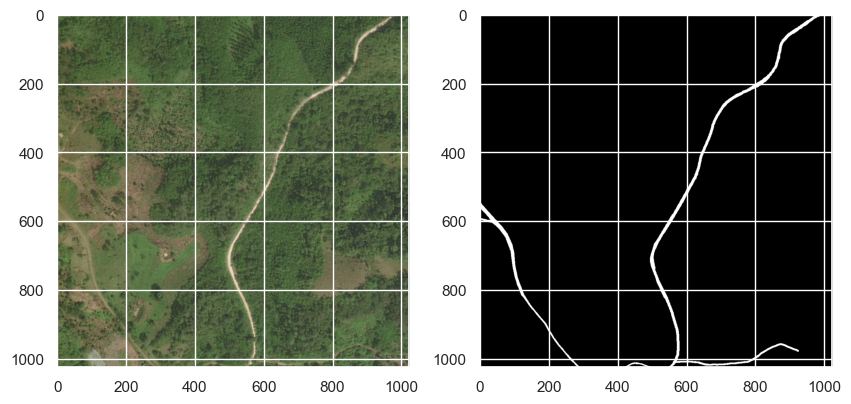

In [44]:
show_image(training_images_paths['sat_image_path'][0], training_images_paths['mask_path'][0])

<BarContainer object of 3 artists>

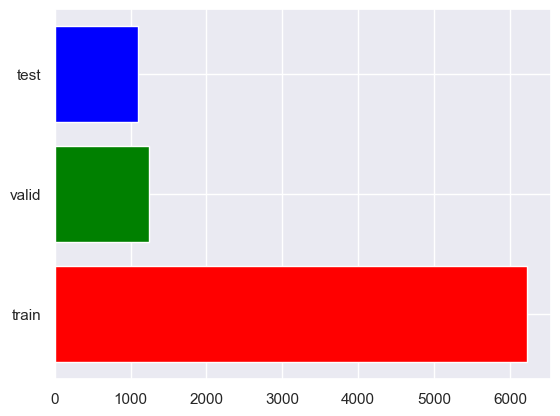

In [45]:
fig, ax = plt.subplots()


labels = list(paths_to_images['split'].unique())

amount = []
for label in labels:
    amount.append(len(paths_to_images[paths_to_images['split'] == label]))

ax.barh(labels, amount, color=COLORS)

### Dataset loaders

In [59]:
class ImageDataLoader(Dataset):
    def __init__(self, X, y, is_valid=False):
        super().__init__()
        self.X = X
        self.y = y
        self.is_valid = is_valid
        
        self.transform = Resize(IMG_DIM)
    
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, index):
        x = self.X.iloc[index]
        
        x_image = Image.open(x)
        x_image_resized = self.transform(x_image)
        x_image_np_array = np.array(x_image_resized).astype(np.float32) / RGB_VAL
        
        if self.is_valid:
            return x_image_np_array
        else:
            y = self.y.iloc[index]
            y_image = Image.open(y)
            y_image_resized = self.transform(y_image)
            y_image_np_array = np.array(y_image_resized).astype(np.float32) / RGB_VAL
            return x_image_np_array, y_image_np_array

In [62]:
train_split = ImageDataLoader(training_images_paths['sat_image_path'], training_images_paths['mask_path'])
train_iterator = DataLoader(train_split, batch_size=BATCH_SIZE, shuffle=False)
x, y = next(iter(train_iterator))

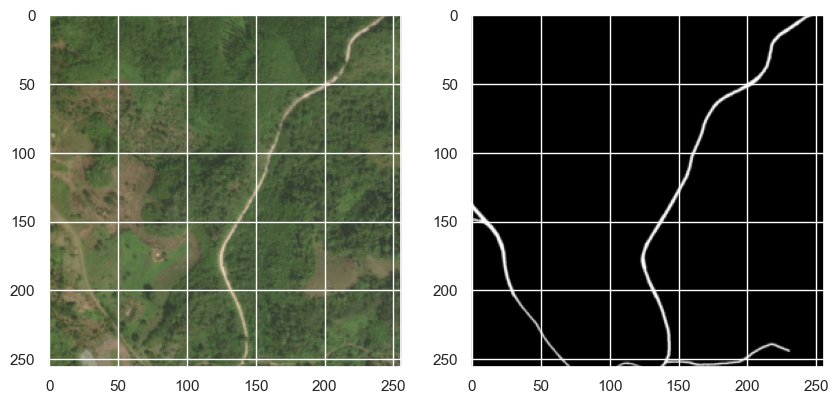

In [63]:
show_image(x[0], y[0])

In [49]:
valid_split = ImageDataLoader(valid_images_paths['sat_image_path'], valid_images_paths['mask_path'], is_valid=True)
valid_iterator = DataLoader(valid_split, batch_size=BATCH_SIZE, shuffle=False)
valid_x = next(iter(valid_iterator))
valid_x = valid_x.to(DEVICE)

In [64]:
test_split = ImageDataLoader(test_images_paths['sat_image_path'], None, is_valid=True)
test_iterator = DataLoader(test_split, batch_size=BATCH_SIZE, shuffle=False)

### Building model

In [50]:
class EncoderBlock(nn.Module):
    def __init__(self, input_channels: int = 3, output_channels: int = 64):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(input_channels, output_channels, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2, 2)),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2, 2)),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2, 2))
        )
    
    def forward(self, x):
        return self.encoder(x)


class DecoderBlock(nn.Module):
    def __init__(self):
        super().__init__()
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2, padding=0),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2, padding=0),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 1, kernel_size=2, stride=2, padding=0),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        return self.decoder(x)


class MaskGenerator(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = EncoderBlock()
        self.decoder = DecoderBlock()
    
    def forward(self, x):
        x = x.permute(0, 3, 2, 1)
        x = self.encoder(x)
        x = self.decoder(x)
        
        return x

In [51]:
model = MaskGenerator()
model.to(DEVICE)

MaskGenerator(
  (encoder): EncoderBlock(
    (encoder): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU()
      (2): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
      (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): ReLU()
      (5): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
      (6): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (7): ReLU()
      (8): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    )
  )
  (decoder): DecoderBlock(
    (decoder): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(2, 2), stride=(2, 2))
      (1): ReLU()
      (2): ConvTranspose2d(128, 64, kernel_size=(2, 2), stride=(2, 2))
      (3): ReLU()
      (4): ConvTranspose2d(64, 1, kernel_size=(2, 2), stride=(2, 2))
      (5): Sigmoid()
    )
  )
)

In [52]:
optimizer = Adam(model.parameters(), lr=LEARNING_RATE)
criterion = BCELoss()

### Training

Epoch 16 results:


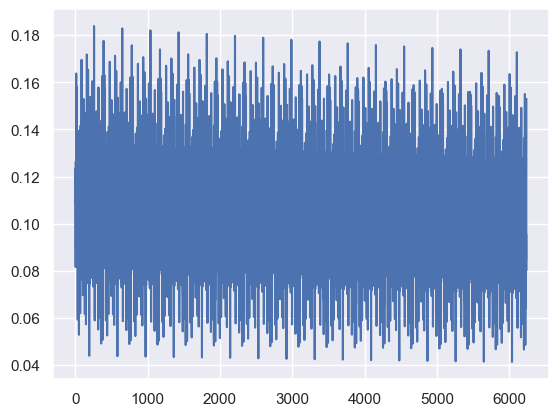

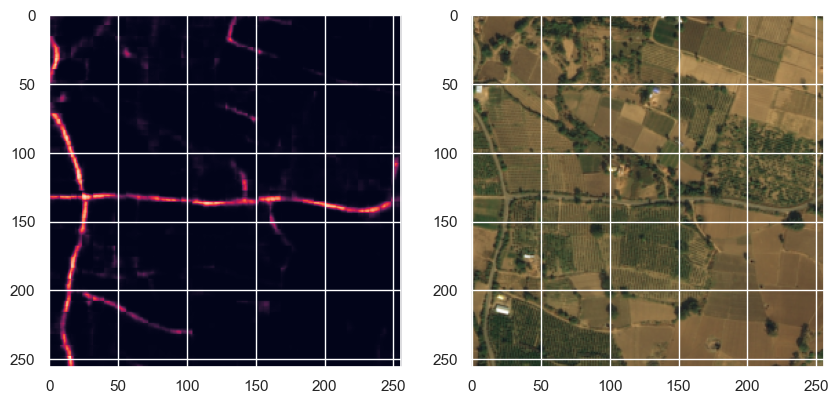

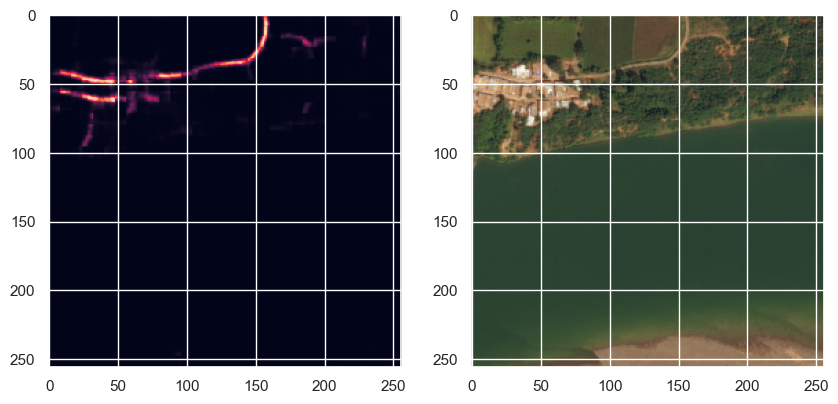

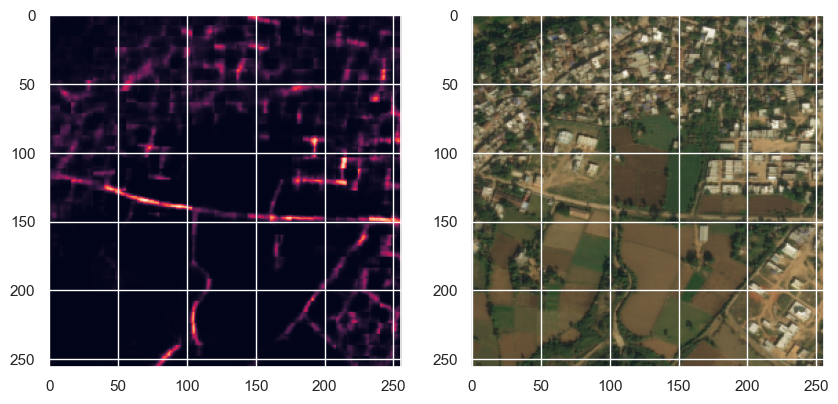

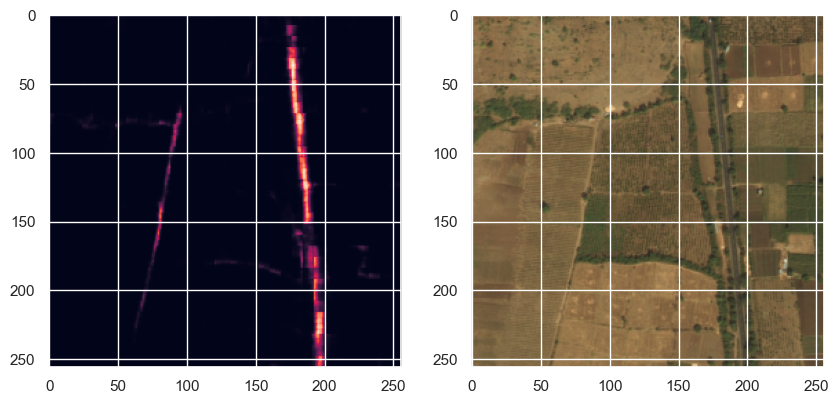

...

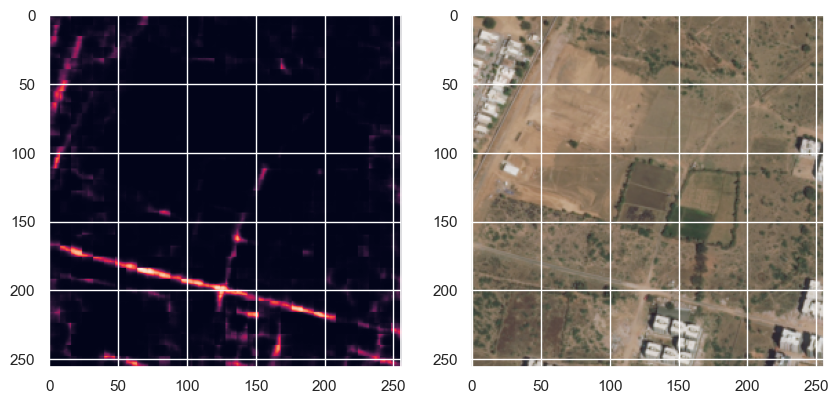

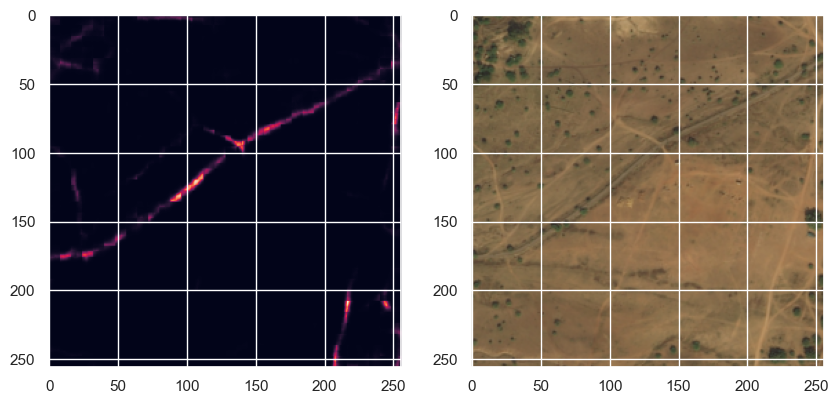

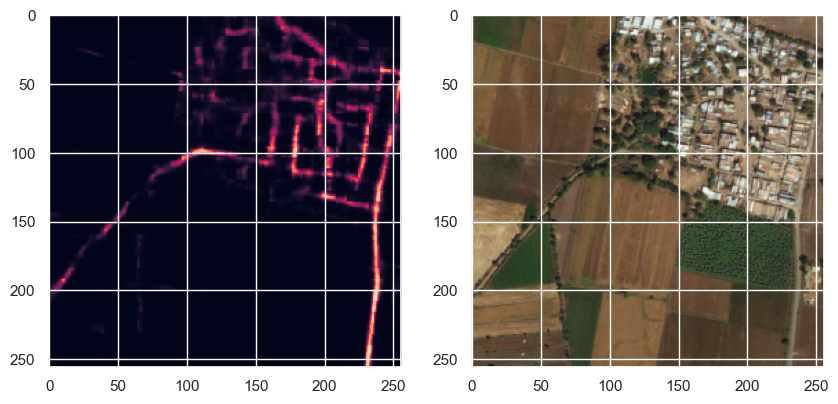

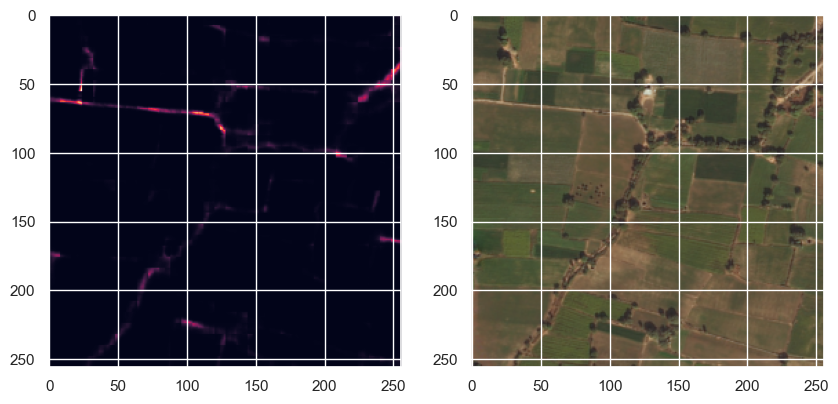

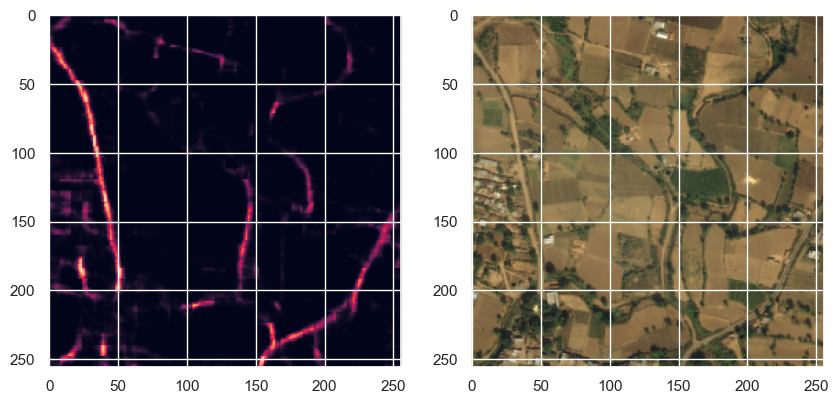

100%|██████████| 16/16 [1:01:40<00:00, 231.29s/it]

Loss: 0.15293365716934204


In [72]:
loss_list = []
valid_len = len(valid_x)

for epoch in tqdm(range(EPOCHS)):
    print(f"Epoch: {epoch + 1}")
    for inp, label in train_iterator:
        optimizer.zero_grad()
        
        label = label.permute(0, 3, 2, 1).to(DEVICE)
        outputs = model(inp.to(DEVICE))
        
        outputs = torch.cat([outputs] * 3, dim=1)
        
        loss = criterion(outputs, label)
        loss.backward()
        optimizer.step()
        
        loss_list.append(loss.item())
    
    clear_output(wait=True)
    
    print(f"Epoch {epoch + 1} results:")
    
    plt.plot(loss_list)
    plt.show()
    
    out = model(valid_x)
    for i in range(valid_len):
        show_image(out[i], valid_x[i], True)
    
    torch.save(model.state_dict(), "model_weights.pth")
    print(f"Loss: {loss.item()}")

### Tests

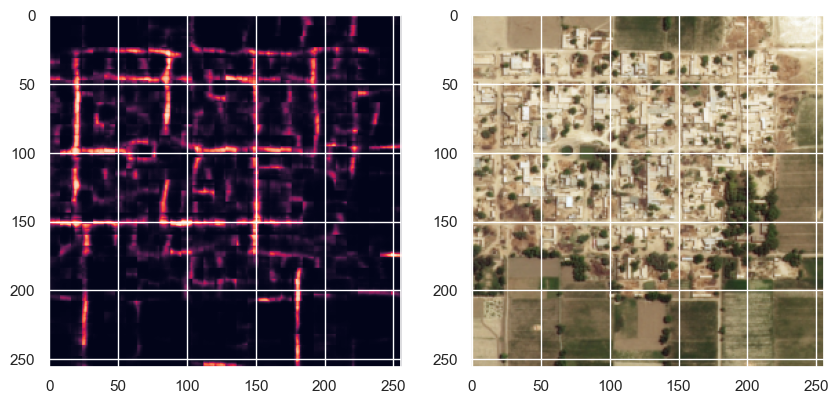

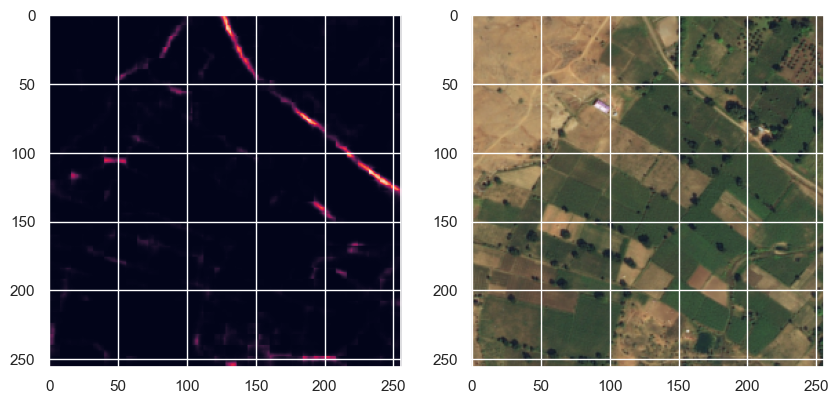

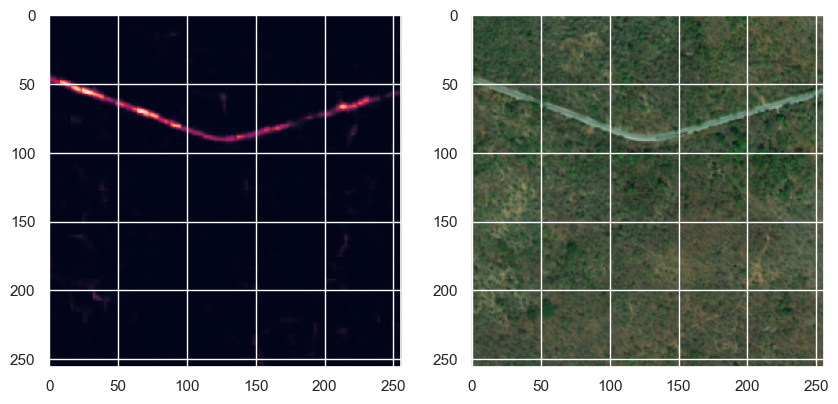

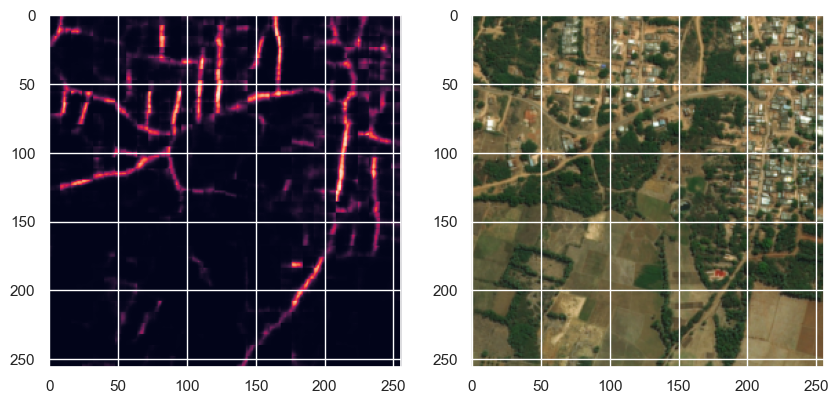

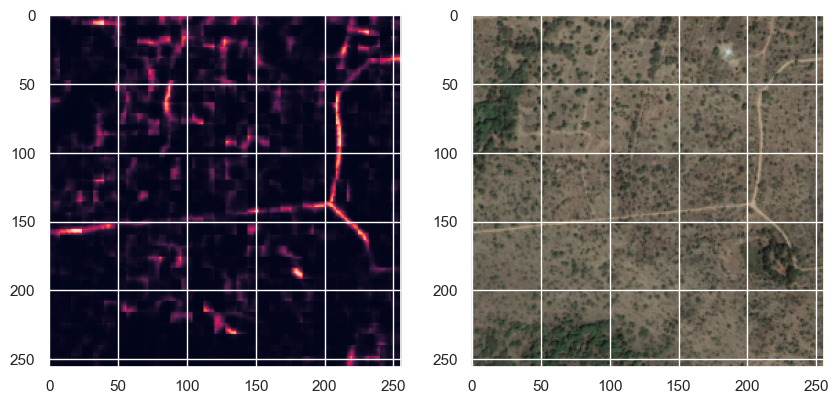

...

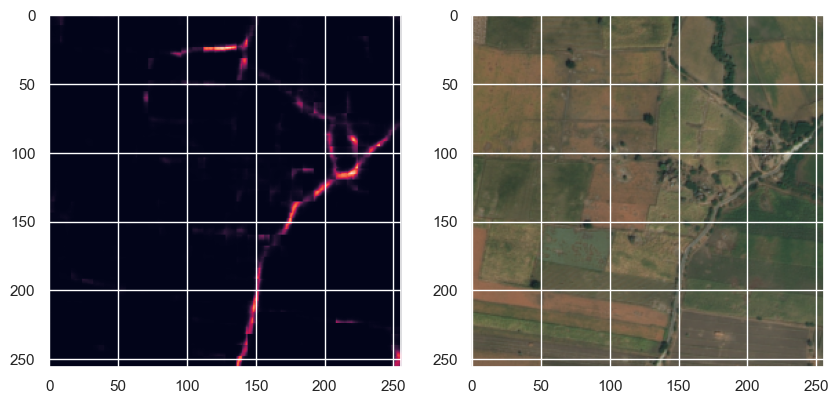

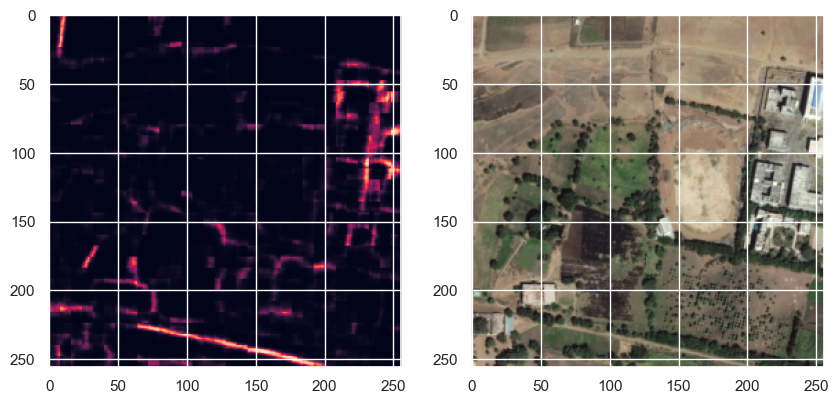

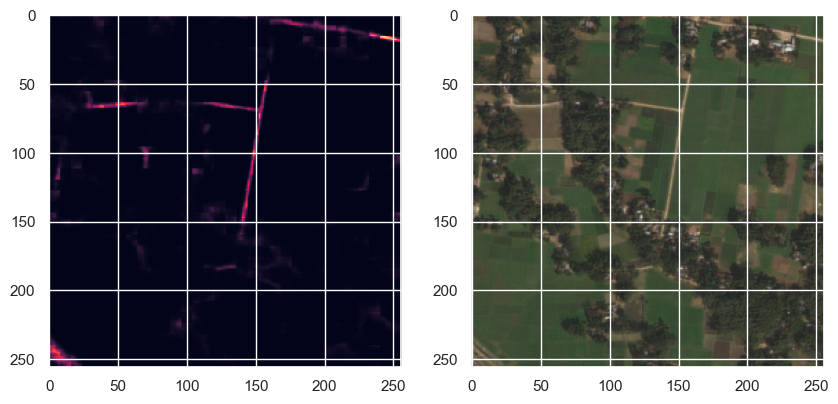

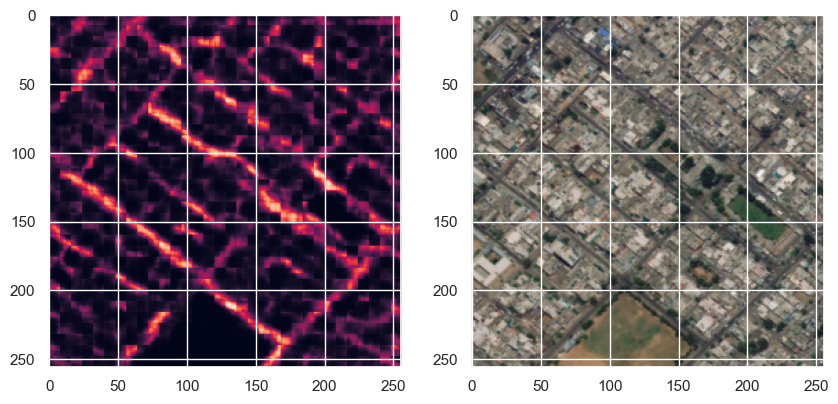

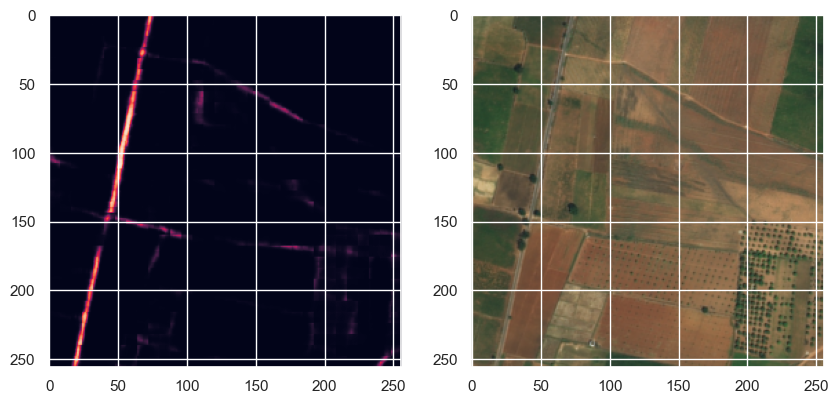

In [73]:
counter = 0

for img in test_iterator:
    img = img.to(DEVICE)
    out = model(img)
    for i in range(len(out)):
        show_image(out[i], img[i], True)
        
        counter += 1
        
        if counter == TEST_TRESHOLD:
            break
        
    if counter == TEST_TRESHOLD:
        break